This is a trial notebook aimed at preparing dataset for MASK-RCNN model. The model used is the one implemented by Mattrport.
Here is the link to their github:
https://github.com/matterport/Mask_RCNN

Data set used is a subset of Open Images 2020 data. Here is the link to the dataset:
https://www.kaggle.com/c/open-images-2019-instance-segmentation/data

A trial run with 10 images is made to train the model, to see if the data is prepared correctly. 


In [89]:
import tensorflow.compat.v1 as tf
tf.disable_v2_behavior()
import tensorflow_hub as hub
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import os
import skimage
import glob
from pathlib import Path
import matplotlib.pyplot as plt
import seaborn as sns
import itertools
%matplotlib inline
import cv2
from collections import defaultdict
from IPython.display import SVG
from tqdm.notebook import tqdm
from PIL import Image
#import tensorflow as tf
from tensorflow.python.client import device_lib
print(device_lib.list_local_devices())
import sys
import shutil
import colorsys
# Root directory of the project

# Import Mask RCNN
  # To find local version of the library
MODEL_DIR = (r'C:\Users\anupa\Mask_RCNN')
os.chdir(MODEL_DIR)
from mrcnn.config import Config
from mrcnn import utils
import mrcnn.model as modellib
from mrcnn import visualize
from mrcnn.model import log

#ROOT_DIR = os.path.abspath("../../")
ROOT_DIR = (r'D:/data/')

sys.path.append(ROOT_DIR)


[name: "/device:CPU:0"
device_type: "CPU"
memory_limit: 268435456
locality {
}
incarnation: 6805625589326952905
]


In [91]:
#Pre-trained model weights
 
#!cd coco_weight && wget --quiet https://github.com/matterport/Mask_RCNN/releases/download/v2.0/mask_rcnn_coco.h5
#!ls -lh mask_rcnn_coco.h5
COCO_WEIGHTS_DIR = "D:/data/mask_rcnn_coco.h5"

In [92]:
DATA_DIR = 'D:/data/train_0/train_0/'
file_list = os.listdir(path )
type(file_list)
filenames_df = pd.DataFrame(file_list)
filenames_df.rename(columns = {0:'image_ids'}, inplace = True)

In [93]:
#Adding height and weights to filename_df
filenames_df['height'] = ""
filenames_df['width'] = ""
#test_df = pd.DataFrame(file_list)
for i, row in tqdm(filenames_df.iterrows(), total = len(filenames_df)): #total = len(test_df)):
    img = Image.open(Path(path)/(filenames_df['image_ids'][i]))
    h, w = img.size
    filenames_df['height'][i] = h
    filenames_df['width'][i] = w
    #hs.append(h)
    #ws.append(w)

In [6]:
#filenames_df.to_csv('D:/data/train_0/train_0/filenames_df.csv')
#filenames_df = pd.read_csv('D:/data/train_0/train_0/filenames_df.csv')

In [94]:
def show_images(images, cols = 1, titles = None):
    """Display a list of images in a single figure with matplotlib.
    
    Parameters
    ---------
    images: List of np.arrays compatible with plt.imshow.
    
    cols (Default = 1): Number of columns in figure (number of rows is 
                        set to np.ceil(n_images/float(cols))).
    
    titles: List of titles corresponding to each image. Must have
            the same length as titles.
    """
    assert((titles is None)or (len(images) == len(titles)))
    n_images = len(images)
    if titles is None: titles = ['Image (%d)' % i for i in range(1,n_images + 1)]
    fig = plt.figure()
    for n, (image, title) in enumerate(zip(images, titles)):
        a = fig.add_subplot(cols, np.ceil(n_images/float(cols)), n + 1)
        image = cv2.imread(path + image)
        if image.ndim == 2:
            plt.gray()
        plt.imshow(image)
        a.set_title(title)
    fig.set_size_inches(np.array(fig.get_size_inches()) * n_images)
    plt.show()
    
#function source

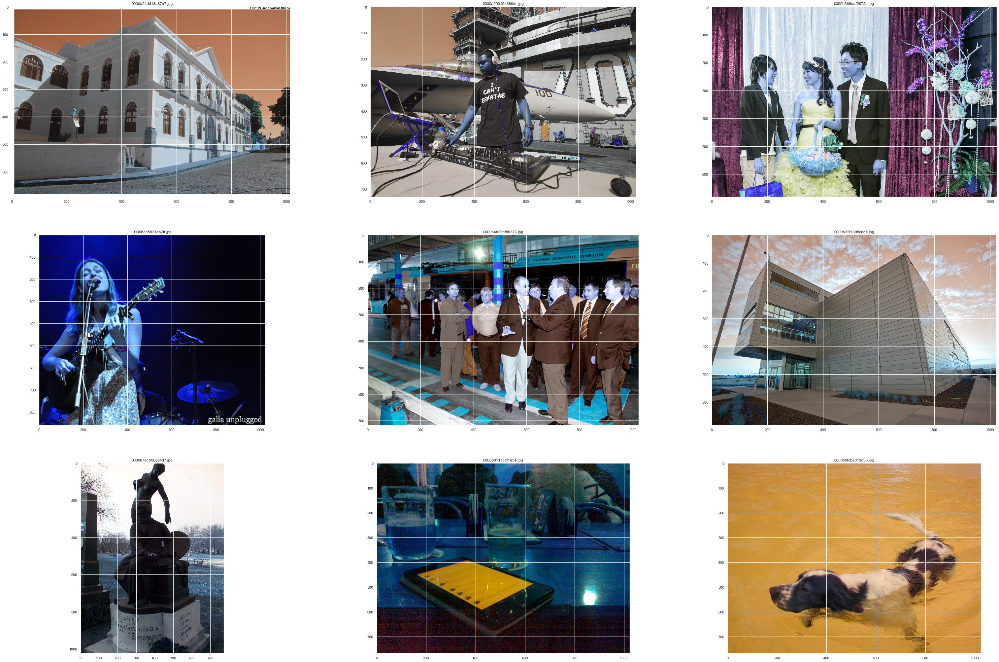

In [95]:
#View Sample Images
images = filenames_df['image_ids'][20:29].values
show_images(images, cols = 3,titles = images)

In [96]:
#Loading annotation data
train_annotations = pd.read_csv(ROOT_DIR + "train-annotations-object-segmentation.csv")
#Loading class names as a dictionary
class_dict = pd.read_csv(ROOT_DIR + "class-descriptions-boxable.csv", header = None).set_index(0).to_dict()
class_dict = class_dict[1]
#number of masks for each image
num_masks = train_annotations.groupby('ImageID').count()['MaskPath'].to_dict()
train_annotations['num_masks'] = train_annotations.ImageID.map(num_masks)

#Making a list of available classes, this list will come in handy while defining dataset class
train_annotations['label'] = train_annotations.LabelName.map(class_dict)
label_list = train_annotations.label.unique()
class_dict = dict()
count = 1
for i in label_list:
    class_dict[count] = i
    count+=1
class_dict_reverse = dict()
class_dict_reverse = {value : key for (key, value) in class_dict.items()}
train_annotations['class'] = train_annotations.label.map(class_dict_reverse)

#loading masks
mask_path = ROOT_DIR + 'train-masks-0/'
mask_file_list = os.listdir(mask_path)
type(mask_file_list)
masks_df = pd.DataFrame(mask_file_list)
masks_df.rename(columns = {0:'MaskPath'}, inplace = True)

In [97]:
#removing filenames which are not present in annotations file
train_annotations['file_names'] = train_annotations.ImageID + '.jpg'
filenames_df = filenames_df[filenames_df['image_ids'].isin(train_annotations['file_names'])]

In [99]:
#3,5,7
mask_images = [i.split('.')[0] for i in [images[2],images[7],images[4]]]
image_list = []
for i in mask_images:
    mask_paths = train_annotations[train_annotations.ImageID == i].MaskPath.values[:3]
    image_list.append(DATA_DIR + '{}.jpg'.format(i))
    image_list.append(mask_path +'{}'.format(mask_paths[0]))
    image_list.append(mask_path +'{}'.format(mask_paths[1]))
    image_list.append(mask_path +'{}'.format(mask_paths[2]))

In [100]:
#modify this function to take image path as well
def show_images(images, cols = 1, titles = None):
    """Display a list of images in a single figure with matplotlib.
    
    Parameters
    ---------
    images: List of np.arrays compatible with plt.imshow.
    
    cols (Default = 1): Number of columns in figure (number of rows is 
                        set to np.ceil(n_images/float(cols))).
    
    titles: List of titles corresponding to each image. Must have
            the same length as titles.
    """
    assert((titles is None)or (len(images) == len(titles)))
    n_images = len(images)
    if titles is None: titles = ['Image (%d)' % i for i in range(1,n_images + 1)]
    fig = plt.figure()
    for n, (image, title) in enumerate(zip(images, titles)):
        a = fig.add_subplot(cols, np.ceil(n_images/float(cols)), n + 1)
        image = cv2.imread(image)
       # if image.ndim == 2:
        #    plt.gray()
        plt.imshow(image)
        a.set_title(title)
    fig.set_size_inches(np.array(fig.get_size_inches()) * n_images)
    plt.show()
    
#function source

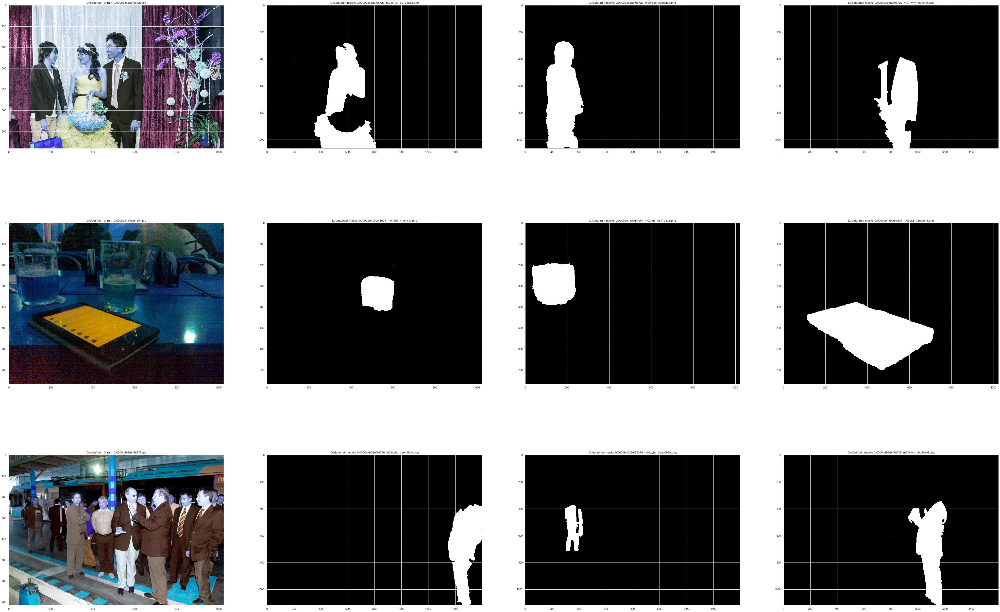

In [101]:
show_images(image_list, cols = 3, titles  = image_list)

C:\Users\anupa\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
  


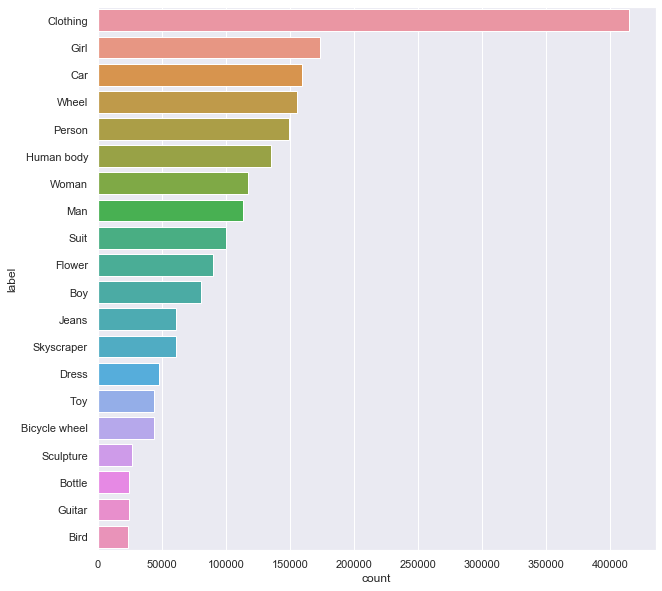

In [102]:
#top 20 classes
import seaborn as sns
sns.set(style='darkgrid')
fig, ax = plt.subplots(figsize = (10,10))
sns.countplot(y='label',data=train_annotations , ax=ax, order = train_annotations['label'].value_counts().iloc[:20].index)
fig.show()

C:\Users\anupa\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
  


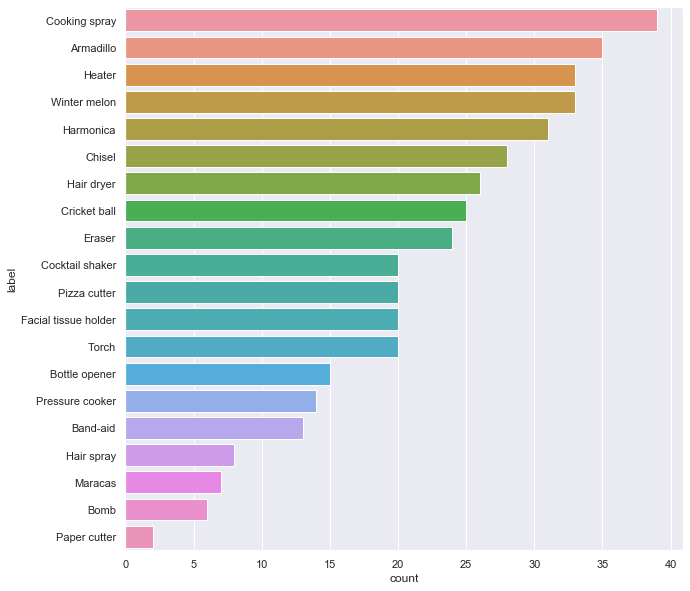

In [103]:
#bottom 20 classes
import seaborn as sns
sns.set(style='darkgrid')
fig, ax = plt.subplots(figsize = (10,10))
sns.countplot(y='label',data=train_annotations , ax=ax, order = train_annotations['label'].value_counts().iloc[330:].index)
fig.show()

In [104]:
#Preparing dataset.

In [105]:
train_annotations.head()

,MaskPath,ImageID,LabelName,BoxID,BoxXMin,BoxXMax,BoxYMin,BoxYMax,PredictedIoU,Clicks,num_masks,label,class,file_names
0,677c122b0eaa5d16_m04yx4_9a041d52.png,677c122b0eaa5d16,/m/04yx4,9a041d52,0.887500,0.960938,0.454167,0.720833,0.86864,0.95498 0.65197 1;0.89370 0.56579 1;0.94701 0....,3,Man,1,677c122b0eaa5d16.jpg
1,05529ae018130c68_m09j2d_b1115fd0.png,05529ae018130c68,/m/09j2d,b1115fd0,0.086875,0.254375,0.504708,0.790960,0.80250,0.16388 0.50114 1;0.25069 0.75425 1;0.13478 0....,2,Clothing,2,05529ae018130c68.jpg
2,96e7ee70b428a54e_m04yx4_05580497.png,96e7ee70b428a54e,/m/04yx4,05580497,0.456250,0.603125,0.222013,0.903104,0.55850,0.52271 0.46625 0;0.52695 0.70150 0;0.59151 0....,2,Man,1,96e7ee70b428a54e.jpg
3,76084f166740d78a_m09j2d_557dfcf5.png,76084f166740d78a,/m/09j2d,557dfcf5,0.018750,0.145625,0.313333,0.754167,0.62394,0.08756 0.34082 0;0.03971 0.34195 1;0.06705 0....,6,Clothing,2,76084f166740d78a.jpg
4,ebaccfc70c721055_m02p0tk3_b39109c0.png,ebaccfc70c721055,/m/02p0tk3,b39109c0,0.097500,0.212500,0.291667,0.930833,0.84223,0.19847 0.85413 1;0.18916 0.34751 1;0.18636 0....,7,Human body,3,ebaccfc70c721055.jpg


In [106]:
#Part 1: Function to make a list of bboxes and shape of images

def extract_boxes(img_id):
    box_list = []
    #for img in filenames_df.image_ids.values[1].split('.')[0]:
    idx_list = list(train_annotations[train_annotations.ImageID == img_id].index)
    for i in idx_list:
        xmin = train_annotations[train_annotations.index == i].BoxXMin.values[0]
        xmax = train_annotations[train_annotations.index == i].BoxXMax.values[0]
        ymin = train_annotations[train_annotations.index == i].BoxYMin.values[0]
        ymax = train_annotations[train_annotations.index == i].BoxYMax.values[0]
        coord = [xmin, xmax, ymin, ymax]
        box_list.append(coord)
   # print(image_id)
    height = filenames_df[filenames_df.image_ids == str(img_id)+'.jpg'].height.values[0]
    weight = filenames_df[filenames_df.image_ids == str(img_id)+'.jpg'].weight.values[0]
    return box_list, weight, height

In [107]:
#extract_boxes("000018acd19b4ad3")

In [110]:
from tensorflow.keras.preprocessing.image import img_to_array
from cv2 import imread

#Part 2: A new class must be defined that extends the mrcnn.utils.Dataset class 
#images_dir = 'D:/data/train_0/train_0/'
#add train, validation functionality
class openImageData(utils.Dataset):
    def load_dataset(self, images_dir, dataset = 'train'):
        # Add classes
        for i in class_dict:
            self.add_class('openImageData',i,class_dict[i])
        images_dir = images_dir
        
        # Add image
        if dataset == 'train':
            start_ind = 0 
            end_ind = 10
        elif dataset == 'val':
            start_ind = 10
            end_ind = 15
        for filename in list(filenames_df.image_ids[start_ind:end_ind].values):#filenames_df.image_ids.values:
            image_id = filename[:-4]
            img_path = images_dir + filename
            height = filenames_df[filenames_df.image_ids == filename].width.values[0]
            width = filenames_df[filenames_df.image_ids == filename].height.values[0]
            num_masks = train_annotations[train_annotations.ImageID == image_id].num_masks.values[0]
            self.add_image('openImageData', image_id=image_id, path=img_path,\
                           height = height, width = width, num_masks=num_masks)
        
    def load_mask(self, image_id):
        
        # get details of image
        info = self.image_info[image_id]
        # use function defined above to extract height, width of image
        #boxes, w, h = extract_boxes(image_id)
        id1 = info['id']
        #print(info)
        #print(image_id)
        masks_list = list(train_annotations[train_annotations.ImageID == id1].MaskPath.values)
        class_list = list(train_annotations[train_annotations.ImageID == id1]['class'].values)
        height = filenames_df[filenames_df.image_ids == str(id1)+'.jpg'].height.values[0]
        width = filenames_df[filenames_df.image_ids == str(id1)+'.jpg'].width.values[0]
        masks = np.zeros((width, height, info['num_masks']), dtype=np.uint8)
        #masks = np.array()
        counter = 0
        for submask in masks_list:
            mask_file_path = mask_path + submask #'D:/data/train-masks-0/'
            mask_array = imread(mask_file_path, cv2.IMREAD_GRAYSCALE)
            dim = (height,width)
            resized = cv2.resize(mask_array, dim, interpolation = cv2.INTER_AREA) 
            #mask_array = img_to_array(mask_file_path)
            masks[:,:,counter] = resized#mask_array
            counter += 1
        
        return masks, np.array(class_list)
    
    def image_reference(self, image_id):
        info = self.image_info[image_id]
        return info['path']


In [111]:
# train set
train_set = openImageData()
train_set.load_dataset(DATA_DIR, dataset = 'train')  #'D:/data/train_0/train_0/'
train_set.prepare()
print('Train: %d' % len(train_set.image_ids))
 

Train: 10


In [128]:
train_set.image_info[4]


{'id': '00003e2837c7b728',
 'source': 'openImageData',
 'path': 'D:/data/train_0/train_0/00003e2837c7b728.jpg',
 'height': 689,
 'width': 1024,
 'num_masks': 2}

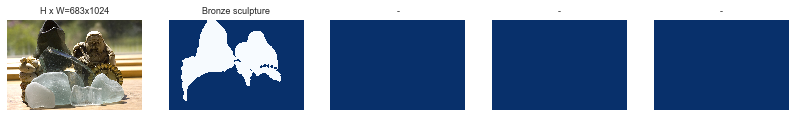

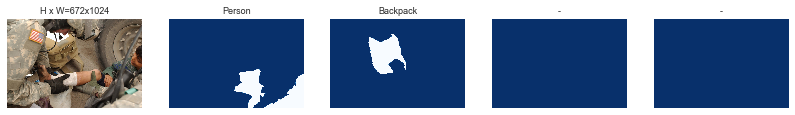

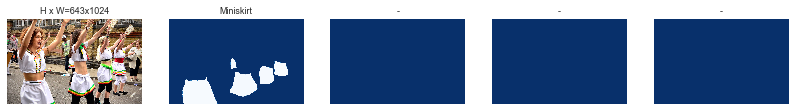

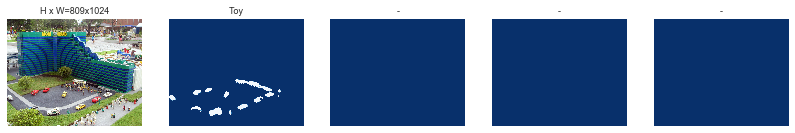

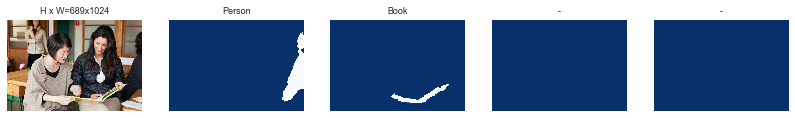

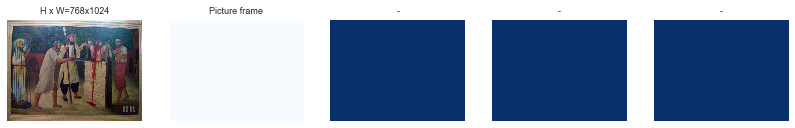

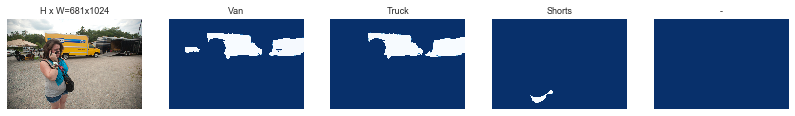

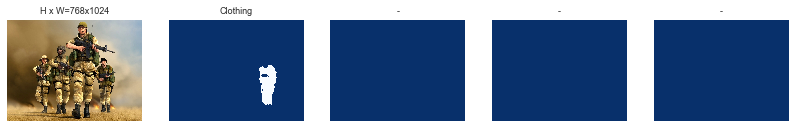

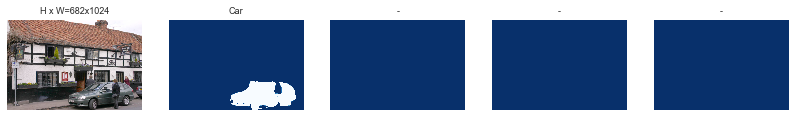

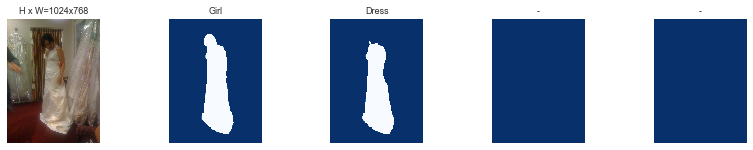

In [127]:
for i in range(10):
    image_id = train_set.image_ids[i]

    image = train_set.load_image(image_id)
    mask, class_ids = train_set.load_mask(image_id)
    visualize.display_top_masks(image, mask, class_ids, train_set.class_names, limit=4)

In [114]:
# val set
val_set = openImageData()
val_set.load_dataset(DATA_DIR,'val')
val_set.prepare()
print('Validation Set: %d' % len(val_set.image_ids))
 

Validation Set: 5


In [115]:
class OpenImagesConfig(Config):
    """Configuration for training on the toy shapes dataset.
    Derives from the base Config class and overrides values specific
    to the toy shapes dataset.
    """
    # Give the configuration a recognizable name
    NAME = "openImageData"

    # Train on 1 GPU and 8 images per GPU. We can put multiple images on each
    # GPU because the images are small. Batch size is 8 (GPUs * images/GPU).
    GPU_COUNT = 1
    IMAGES_PER_GPU = 8

    # Number of classes (including background)
    NUM_CLASSES = 1 + 350

    # Use small images for faster training. Set the limits of the small side
    # the large side, and that determines the image shape.
    IMAGE_MIN_DIM = 128
    IMAGE_MAX_DIM = 128

    # Use smaller anchors because our image and objects are small
    RPN_ANCHOR_SCALES = (8, 16, 32, 64, 128)  # anchor side in pixels

    # Reduce training ROIs per image because the images are small and have
    # few objects. Aim to allow ROI sampling to pick 33% positive ROIs.
    TRAIN_ROIS_PER_IMAGE = 32

    # Use a small epoch since the data is simple
    STEPS_PER_EPOCH = 5#100

    # use small validation steps since the epoch is small
    VALIDATION_STEPS = 5
    #Dtection_Min_Confidence
    DETECTION_MIN_CONFIDENCE = 0.9
    
config = OpenImagesConfig()
config.display()


Configurations:
BACKBONE                       resnet101
BACKBONE_STRIDES               [4, 8, 16, 32, 64]
BATCH_SIZE                     8
BBOX_STD_DEV                   [0.1 0.1 0.2 0.2]
COMPUTE_BACKBONE_SHAPE         None
DETECTION_MAX_INSTANCES        100
DETECTION_MIN_CONFIDENCE       0.9
DETECTION_NMS_THRESHOLD        0.3
FPN_CLASSIF_FC_LAYERS_SIZE     1024
GPU_COUNT                      1
GRADIENT_CLIP_NORM             5.0
IMAGES_PER_GPU                 8
IMAGE_CHANNEL_COUNT            3
IMAGE_MAX_DIM                  128
IMAGE_META_SIZE                363
IMAGE_MIN_DIM                  128
IMAGE_MIN_SCALE                0
IMAGE_RESIZE_MODE              square
IMAGE_SHAPE                    [128 128   3]
LEARNING_MOMENTUM              0.9
LEARNING_RATE                  0.001
LOSS_WEIGHTS                   {'rpn_class_loss': 1.0, 'rpn_bbox_loss': 1.0, 'mrcnn_class_loss': 1.0, 'mrcnn_bbox_loss': 1.0, 'mrcnn_mask_loss': 1.0}
MASK_POOL_SIZE                 14
MASK_SHAPE            

In [116]:
# define the model
model = modellib.MaskRCNN(mode="training", config=config,
                          model_dir=MODEL_DIR)

In [117]:
# Which weights to start with?
init_with = "coco"  # imagenet, coco, or last

if init_with == "imagenet":
    model.load_weights(model.get_imagenet_weights(), by_name=True)
elif init_with == "coco":
    # Load weights trained on MS COCO, but skip layers that
    # are different due to the different number of classes
    # See README for instructions to download the COCO weights
    model.load_weights(COCO_WEIGHTS_PATH, by_name=True,
                       exclude=["mrcnn_class_logits", "mrcnn_bbox_fc", 
                                "mrcnn_bbox", "mrcnn_mask"])
elif init_with == "last":
    # Load the last model you trained and continue training
    model.load_weights(model.find_last(), by_name=True)

In [118]:
# Fine tune all layers
# Passing layers="all" trains all layers. You can also 
# pass a regular expression to select which layers to
# train by name pattern.
model.train(train_set, val_set, 
            learning_rate=config.LEARNING_RATE, 
            epochs=1, 
            layers='heads')


Starting at epoch 0. LR=0.001

Checkpoint Path: C:\Users\anupa\Mask_RCNN\openimagedata20200905T2119\mask_rcnn_openimagedata_{epoch:04d}.h5
Selecting layers to train
fpn_c5p5               (Conv2D)
fpn_c4p4               (Conv2D)
fpn_c3p3               (Conv2D)
fpn_c2p2               (Conv2D)
fpn_p5                 (Conv2D)
fpn_p2                 (Conv2D)
fpn_p3                 (Conv2D)
fpn_p4                 (Conv2D)
In model:  rpn_model
    rpn_conv_shared        (Conv2D)
    rpn_class_raw          (Conv2D)
    rpn_bbox_pred          (Conv2D)
mrcnn_mask_conv1       (TimeDistributed)
mrcnn_mask_bn1         (TimeDistributed)
mrcnn_mask_conv2       (TimeDistributed)
mrcnn_mask_bn2         (TimeDistributed)
mrcnn_class_conv1      (TimeDistributed)
mrcnn_class_bn1        (TimeDistributed)
mrcnn_mask_conv3       (TimeDistributed)
mrcnn_mask_bn3         (TimeDistributed)
mrcnn_class_conv2      (TimeDistributed)
mrcnn_class_bn2        (TimeDistributed)
mrcnn_mask_conv4       (TimeDistributed

C:\Users\anupa\AppData\Local\Continuum\anaconda3\lib\site-packages\tensorflow_core\python\framework\indexed_slices.py:424: UserWarning: Converting sparse IndexedSlices to a dense Tensor of unknown shape. This may consume a large amount of memory.
  "Converting sparse IndexedSlices to a dense Tensor of unknown shape. "
C:\Users\anupa\AppData\Local\Continuum\anaconda3\lib\site-packages\tensorflow_core\python\framework\indexed_slices.py:424: UserWarning: Converting sparse IndexedSlices to a dense Tensor of unknown shape. This may consume a large amount of memory.
  "Converting sparse IndexedSlices to a dense Tensor of unknown shape. "
C:\Users\anupa\AppData\Local\Continuum\anaconda3\lib\site-packages\tensorflow_core\python\framework\indexed_slices.py:424: UserWarning: Converting sparse IndexedSlices to a dense Tensor of unknown shape. This may consume a large amount of memory.
  "Converting sparse IndexedSlices to a dense Tensor of unknown shape. "


Epoch 1/1
5/5 [==============================] - 329s 66s/step - loss: 8.6991 - val_loss: 5.2233


In [120]:
# Typically not needed because callbacks save after every epoch
# Uncomment to save manually
model_path = os.path.join(MODEL_DIR, "mask_rcnn_openImages_mark1.h5")
model.keras_model.save_weights(model_path)

In [121]:
class InferenceConfig(OpenImagesConfig):
    GPU_COUNT = 1
    IMAGES_PER_GPU = 1
    

inference_config = InferenceConfig()

# Recreate the model in inference mode
model = modellib.MaskRCNN(mode="inference", 
                          config=inference_config,
                          model_dir=MODEL_DIR)

# Get path to saved weights
# Either set a specific path or find last trained weights
# model_path = os.path.join(ROOT_DIR, ".h5 file name here")
model_path = model.find_last()

# Load trained weights
print("Loading weights from ", model_path)
model.load_weights(model_path, by_name=True)

Loading weights from  C:\Users\anupa\Mask_RCNN\openimagedata20200905T2119\mask_rcnn_openimagedata_0001.h5
Re-starting from epoch 1


original_image           shape: (128, 128, 3)         min:    0.00000  max:  253.00000  uint8
image_meta               shape: (363,)                min:    0.00000  max: 1024.00000  float64
gt_class_id              shape: (2,)                  min:    6.00000  max:   10.00000  int64
gt_bbox                  shape: (2, 4)                min:   32.00000  max:  128.00000  int32
gt_mask                  shape: (128, 128, 2)         min:    0.00000  max:  255.00000  uint8


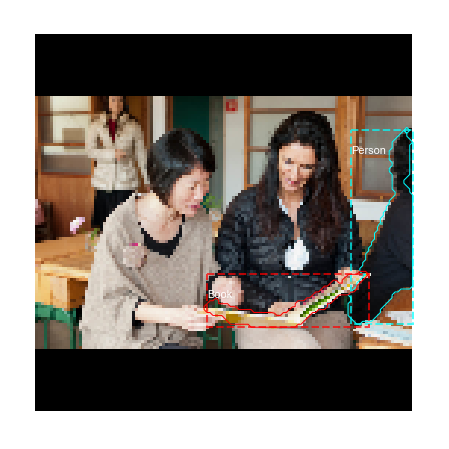

In [122]:
# Test on a random image
import random
image_id = random.choice(train_set.image_ids)
original_image, image_meta, gt_class_id, gt_bbox, gt_mask =\
    modellib.load_image_gt(train_set, inference_config, 
                           image_id, use_mini_mask=False)

log("original_image", original_image)
log("image_meta", image_meta)
log("gt_class_id", gt_class_id)
log("gt_bbox", gt_bbox)
log("gt_mask", gt_mask)

visualize.display_instances(original_image, gt_bbox, gt_mask, gt_class_id, 
                            train_set.class_names, figsize=(8, 8))

Processing 1 images
image                    shape: (128, 128, 3)         min:    0.00000  max:  253.00000  uint8
molded_images            shape: (1, 128, 128, 3)      min: -123.70000  max:  147.10000  float64
image_metas              shape: (1, 363)              min:    0.00000  max:  128.00000  int32
anchors                  shape: (1, 4092, 4)          min:   -0.71267  max:    1.20874  float32

*** No instances to display *** 



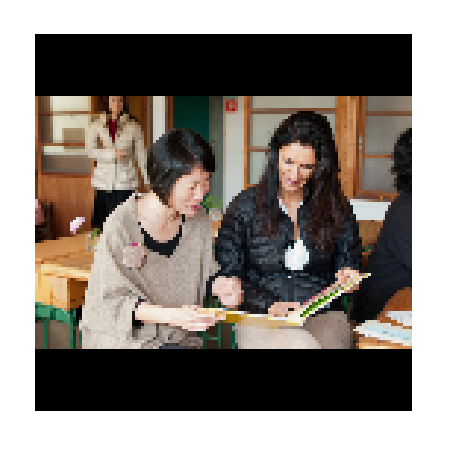

In [123]:
results = model.detect([original_image], verbose=1)

r = results[0]
visualize.display_instances(original_image, r['rois'], r['masks'], r['class_ids'], 
                            train_set.class_names, r['scores'], figsize=(8, 8))

Experiments using pretrained model on COCO data set

In [124]:
from mrcnn.config import Config

class DetectorConfig(Config):
   
    # Configuration name  
    NAME = 'instances'
    
    # We have one GPU available, but can put multiple images on it
    # Batch size is 8 (GPUs * images/GPU)
    GPU_COUNT = 1
    IMAGES_PER_GPU = 8
    
    BACKBONE = 'resnet101' #'resnet101' would be another option
    
    NUM_CLASSES = 2  # background + pneumonia classes -->semantic segmentation
    
    IMAGE_MIN_DIM = 256
    IMAGE_MAX_DIM = 256
    TRAIN_ROIS_PER_IMAGE = 32 #or 16
    MAX_GT_INSTANCES = 4 #or 3
    DETECTION_MAX_INSTANCES = 3
    DETECTION_MIN_CONFIDENCE = 0.78  #or 0.7
    DETECTION_NMS_THRESHOLD = 0.01 #or 0.3
    STEPS_PER_EPOCH = 200 #or 500
    
config = DetectorConfig()
config.display()


Configurations:
BACKBONE                       resnet101
BACKBONE_STRIDES               [4, 8, 16, 32, 64]
BATCH_SIZE                     8
BBOX_STD_DEV                   [0.1 0.1 0.2 0.2]
COMPUTE_BACKBONE_SHAPE         None
DETECTION_MAX_INSTANCES        3
DETECTION_MIN_CONFIDENCE       0.78
DETECTION_NMS_THRESHOLD        0.01
FPN_CLASSIF_FC_LAYERS_SIZE     1024
GPU_COUNT                      1
GRADIENT_CLIP_NORM             5.0
IMAGES_PER_GPU                 8
IMAGE_CHANNEL_COUNT            3
IMAGE_MAX_DIM                  256
IMAGE_META_SIZE                14
IMAGE_MIN_DIM                  256
IMAGE_MIN_SCALE                0
IMAGE_RESIZE_MODE              square
IMAGE_SHAPE                    [256 256   3]
LEARNING_MOMENTUM              0.9
LEARNING_RATE                  0.001
LOSS_WEIGHTS                   {'rpn_class_loss': 1.0, 'rpn_bbox_loss': 1.0, 'mrcnn_class_loss': 1.0, 'mrcnn_bbox_loss': 1.0, 'mrcnn_mask_loss': 1.0}
MASK_POOL_SIZE                 14
MASK_SHAPE             

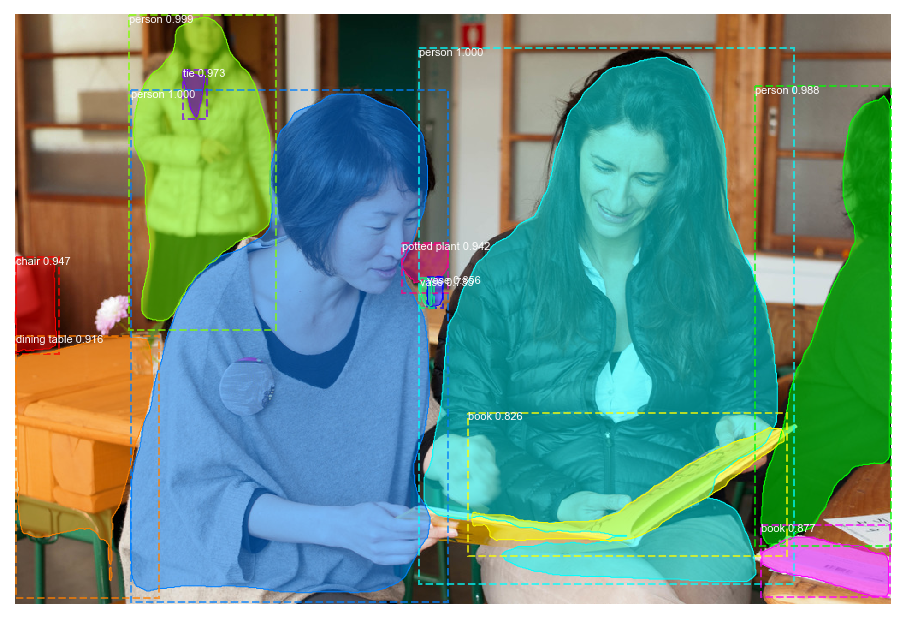

In [129]:
# example of inference with a pre-trained coco model
from keras.preprocessing.image import load_img
from keras.preprocessing.image import img_to_array
from mrcnn.visualize import display_instances
from mrcnn.config import Config
from mrcnn.model import MaskRCNN
 
# define 81 classes that the coco model knows about

class_names = ['BG', 'person', 'bicycle', 'car', 'motorcycle', 'airplane',
               'bus', 'train', 'truck', 'boat', 'traffic light',
               'fire hydrant', 'stop sign', 'parking meter', 'bench', 'bird',
               'cat', 'dog', 'horse', 'sheep', 'cow', 'elephant', 'bear',
               'zebra', 'giraffe', 'backpack', 'umbrella', 'handbag', 'tie',
               'suitcase', 'frisbee', 'skis', 'snowboard', 'sports ball',
               'kite', 'baseball bat', 'baseball glove', 'skateboard',
               'surfboard', 'tennis racket', 'bottle', 'wine glass', 'cup',
               'fork', 'knife', 'spoon', 'bowl', 'banana', 'apple',
               'sandwich', 'orange', 'broccoli', 'carrot', 'hot dog', 'pizza',
               'donut', 'cake', 'chair', 'couch', 'potted plant', 'bed',
               'dining table', 'toilet', 'tv', 'laptop', 'mouse', 'remote',
               'keyboard', 'cell phone', 'microwave', 'oven', 'toaster',
               'sink', 'refrigerator', 'book', 'clock', 'vase', 'scissors',
               'teddy bear', 'hair drier', 'toothbrush']

#class_names = ['car','Car'] 
# define the test configuration
class ImgConfig(Config):
    NAME = "images"
    GPU_COUNT = 1
    IMAGES_PER_GPU = 1
    NUM_CLASSES = 1 + 80

# define the model
rcnn = MaskRCNN(mode='inference', model_dir=MODEL_DIR, config=ImgConfig())
# load coco model weights
rcnn.load_weights(COCO_WEIGHTS_PATH, by_name=True)
# load image
img = load_img(DATA_DIR + '00003e2837c7b728.jpg')
img = img_to_array(img)
# make prediction
results = rcnn.detect([img], verbose=0)
# get dictionary for first prediction
r = results[0]
# show photo with bounding boxes, masks, class labels and scores
#if (class_names == 'car'):
display_instances(img, r['rois'], r['masks'], r['class_ids'], class_names, r['scores'])